<a href="https://colab.research.google.com/github/kalinkabel/Vis-o_Computacional/blob/main/Mask_R_CNN_Baloes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Segmentação de Instância  com Mask_RCNN treinamentos com balões**

In [ ]:
!git clone https://github.com/alsombra/Mask_RCNN-TF2

In [4]:
%cd Mask_RCNN-TF2/

/content/Mask_RCNN-TF2


In [ ]:
!pip install -r requirements.txt

In [ ]:
!python setup.py install

In [ ]:
!pip install tensorflow==2.9.2
!pip install tensorflow-gpu==2.9.2

In [8]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib.pyplot as plt
import json
import pandas as pd

In [9]:
import skimage.draw
from skimage.io import imread
#import skimage

In [10]:
import tensorflow
tensorflow.__version__

'2.9.2'

In [11]:
from mrcnn.config import Config
import mrcnn.utils as utils
from mrcnn import visualize
import mrcnn.model as modellib
from mrcnn.model import log

In [12]:
path_raiz = os.path.abspath('/content/Mask_RCNN-TF2')

In [ ]:
!wget https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip

In [ ]:
!unzip balloon_dataset.zip

t**Carregamento Dataset**

In [80]:
class DatasetPersonalizado(utils.Dataset):

    def load_object(self, dataset_dir, subset, nome_annotation="via_region_data.json"):
        """Carrega um subconjunto do dataset Balloon.
        dataset_dir: Diretorio raíz do dataset.
        subset: Subconjunto a ser carregado: train (treinamento) ou val (validação)
        """
        # Adiciona as classes. Nesse exemplo, temos apenas uma classe para adicionar.
        self.add_class("objetos", 1, "balloon")

        # Escolhe se é o dataset de Treinamento ou Validação
        assert subset in ["train", "val"]
        dataset_dir = os.path.join(dataset_dir, subset)

        # Carrega as anotações (annotations)
        # VGG Image Annotator (Até a verão 1.6) salva cada imagem no formato:
        # { 'filename': '28503151_5b5b7ec140_b.jpg',
        #   'regions': {
        #       '0': {
        #           'region_attributes': {},
        #           'shape_attributes': {
        #               'all_points_x': [...],
        #               'all_points_y': [...],
        #               'name': 'polygon'}},
        #       ... more regions ...
        #   },
        #   'size': 100202
        # }
        # O que mais interessa para nós são as coordenadas x e y de cada região
        # Obs: No VIA 2.0, as regiões são salvas em forma de lista ao invés de dicionario.
        annotations = json.load(open(os.path.join(dataset_dir, nome_annotation)))
        annotations = list(annotations.values())  # não precisa das dict keys

        # A ferramenta VIA salva as imagens em JSON mesmo que elas não contenham nenhuma anotação. Então, pulamos as imagens não anotadas.
        annotations = [a for a in annotations if a['regions']]

        contagem = 0
        # Adiciona as imagens
        for a in annotations:
            # Pega as coordenadas x e y dos pontos dos poligonos que formam o contorno de cada instância do objeto.
            # Eles são armazenadas em shape_attributes (para visualizar, abra o arquivo json)
            # A condição if é necessária para que o código suporte anotações geradas pelas versões 1.x e 2.x da VIA.
            if type(a['regions']) is dict:
                polygons = [r['shape_attributes'] for r in a['regions'].values()]
            else:
                polygons = [r['shape_attributes'] for r in a['regions']]

            # A função load_mask() vai precisar do tamanho da imagem para que possa converter os polígonos em mascaras.
            # Infelizmente, o VIA não inclui isso no JSON, então devemos ler a imagem manualmente e gerar essas máscaras.
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]
            contagem = contagem+1

            self.add_image("objetos",
                image_id=a['filename'],  # usa o nome do arquivo como id unico da imagem
                path=image_path,
                width=width, height=height,
                polygons=polygons)

        print("Imagens "+subset+": " + str(contagem))

    def load_mask(self, image_id):
        """Gera as mascaras das instâncias para a imagem.
       Returna:
        masks: Uma array booleana de formato/shape [height, width, instance count] com 1 mascara por instancia.
        class_ids: uma array de 1D contendo os IDs das mascaras das instancias.
        """
        # Se não for uma imagem de conjunto de dados do balão (balloon dataset), delegue à classe ascendente.
        image_info = self.image_info[image_id]
        #print(image_info)
        if image_info["source"] != "objetos":
            return super(self.__class__, self).load_mask(image_id)

        # Converte os poligonos em uma mascara bitmap com shape  [height, width, instance_count]
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)

        # Agora será calculado a máscara da instância. para cada pixel da imagem, classificará como pertencente à classe ou não
        for i, p in enumerate(info["polygons"]):
            # Pega os indices dos pixels dentro dos poligonos e define eles como = 1 (cor branca), caso contrário continuará valor 0 (cor preta)
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'], mask.shape) # passamos o .shape também como 3ª parâmetro para evitar possíveis erros

            ## Obs: para esse dataset a anotação foi feita usando formas poligonais.
            ## Entretanto, caso tenha usado outras formas pela ferramenta VIA (circulos e elipses) deverá especificar isso no código, ficando assim
            #if p['name'] == 'polygon':
            #  rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'], mask.shape)
            #elif p['name'] == 'circle':
            #  rr, cc = skimage.draw.circle(p['cx'], p['cy'], p['r'])
            #else:
            #  rr, cc = skimage.draw.ellipse(p['cx'], p['cy'], p['rx'], p['ry'], rotation=np.deg2rad(p['theta']))

            mask[rr, cc, i] = 1

        # Retorna a mascara e a array dos IDs das classes de cada instancia.
        # Como nesse exemplo temos uma classe apenas, retornamos uma array composta de 1s
        return mask.astype(np.bool_), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Retorna o caminho da imagem."""
        info = self.image_info[image_id]
        if info["source"] == "objetos":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)


In [81]:
nome_annotation = 'via_region_data.json'
path_dataset = "/content/Mask_RCNN-TF2/balloon"
# Conjunto de treinamento
dataset_train = DatasetPersonalizado()
dataset_train.load_object(path_dataset, 'train', nome_annotation)
dataset_train.prepare()

Imagens train: 61


In [82]:
# Conjunto de validação
dataset_val = DatasetPersonalizado()
dataset_val.load_object(path_dataset, 'val', nome_annotation)
dataset_val.prepare()

Imagens val: 13


**Visualização do dataset**

In [83]:
def mostrar(img):
  fig = plt.gcf()
  fig.set_size_inches(16, 10)
  plt.axis("off")
  plt.imshow(img)
  plt.show()

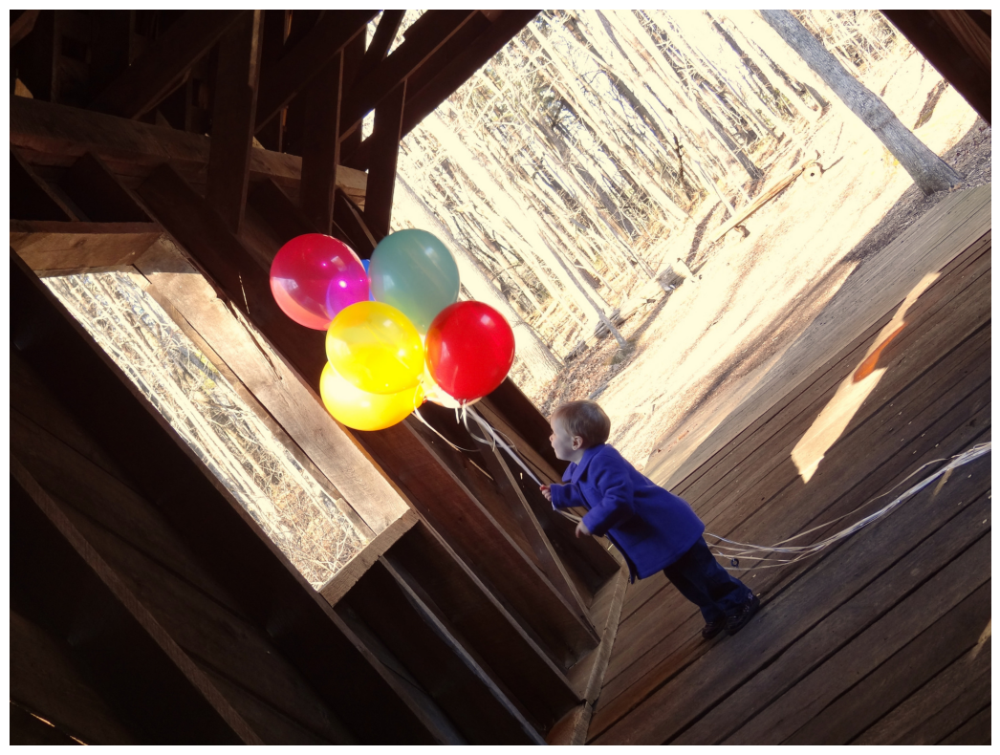

In [84]:
img_id = 7
img = dataset_train.load_image(img_id)
mostrar(img)

In [85]:
mask, class_ids = dataset_train.load_mask(img_id)

In [86]:
class_ids

array([1, 1, 1, 1, 1, 1], dtype=int32)

In [ ]:
mask, np.unique(mask, return_counts=True)

In [88]:
dataset_train.class_names

['BG', 'balloon']

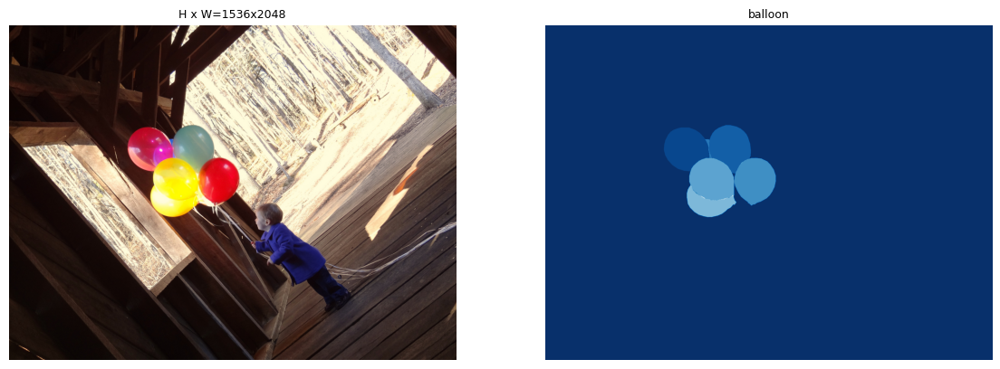

In [89]:
visualize.display_top_masks(img, mask, class_ids, dataset_train.class_names, 1)

In [90]:
dataset_train.image_ids

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60])

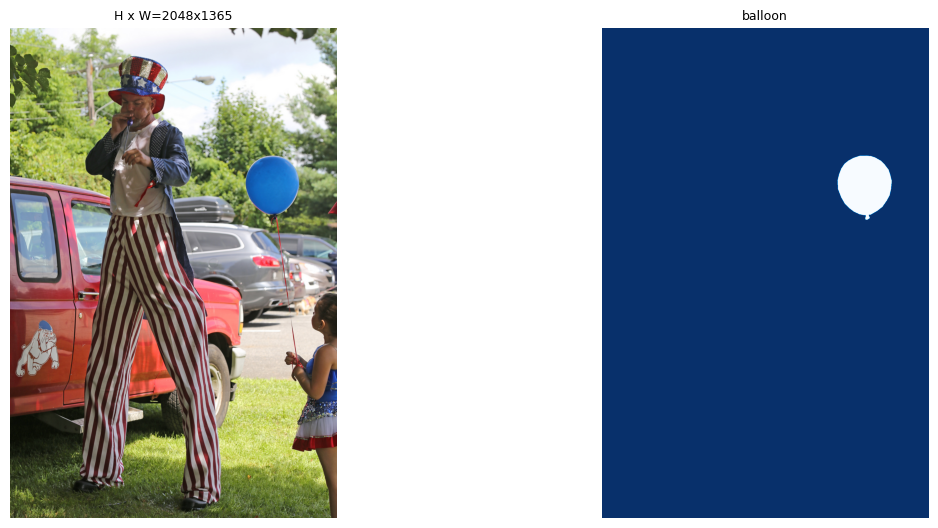

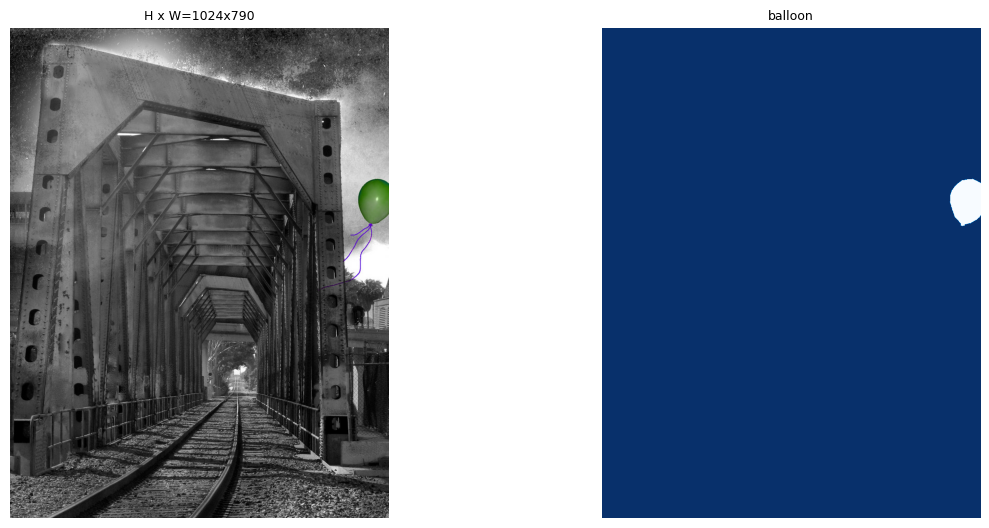

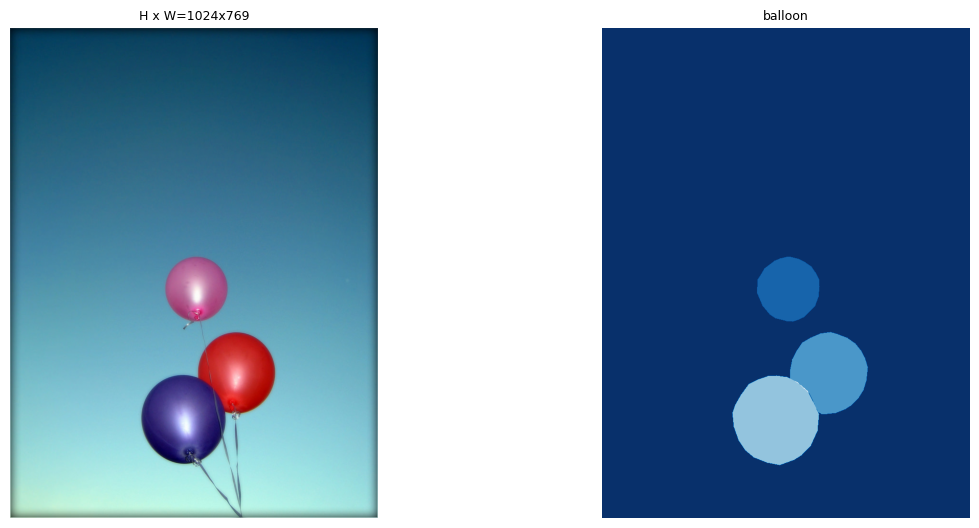

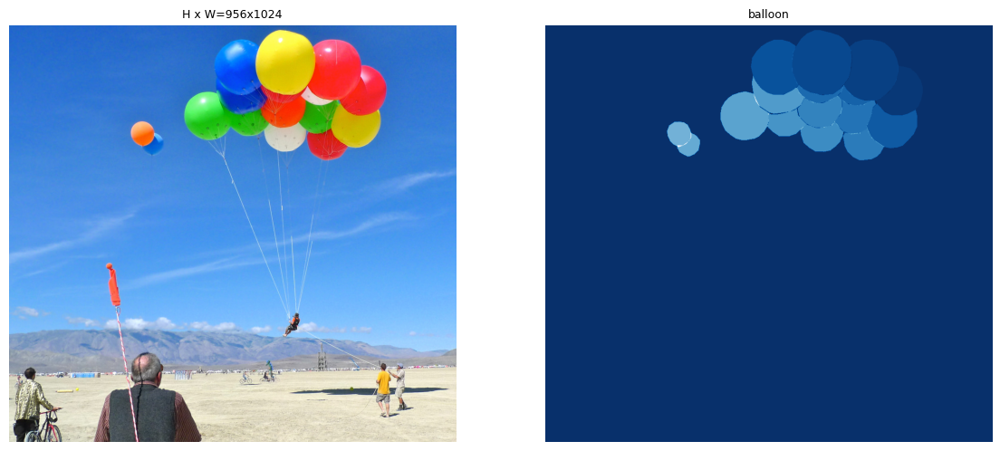

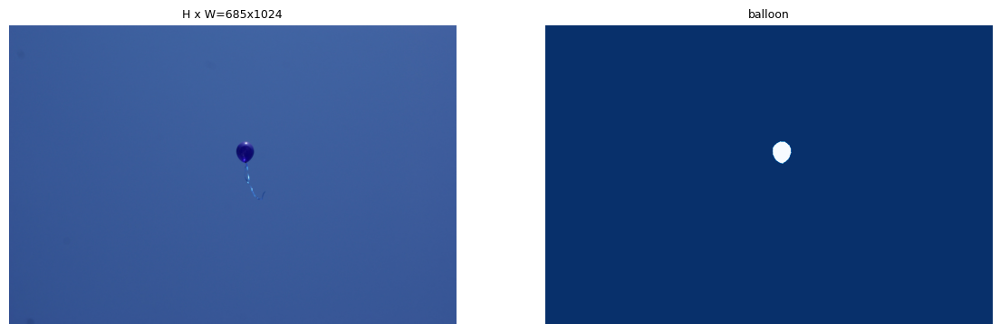

In [91]:
img_ids = np.random.choice(dataset_train.image_ids, 5)
for img_id in img_ids:
  img = dataset_train.load_image(img_id)
  mask, class_ids = dataset_train.load_mask(img_id)
  visualize.display_top_masks(img, mask, class_ids, dataset_train.class_names, 1)

In [92]:
img_id = 7
img = dataset_train.load_image(img_id)
mask, class_ids = dataset_train.load_mask(img_id)
bbox = utils.extract_bboxes(mask)

In [93]:
bbox

array([[ 468,  542,  671,  751],
       [ 457,  748,  681,  941],
       [ 522,  730,  610,  763],
       [ 608,  864,  828, 1056],
       [ 608,  659,  804,  865],
       [ 733,  648,  881,  874]], dtype=int32)

In [94]:
print('Imagem', img_id, dataset_train.image_reference(img_id))
log('image', img)
log('mask', mask)
log('class_ids', class_ids)
log('bbox', bbox)

Imagem 7 /content/Mask_RCNN-TF2/balloon/train/15717689633_5f7f78c28e_k.jpg
image                    shape: (1536, 2048, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1536, 2048, 6)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (6,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (6, 4)                min:  457.00000  max: 1056.00000  int32


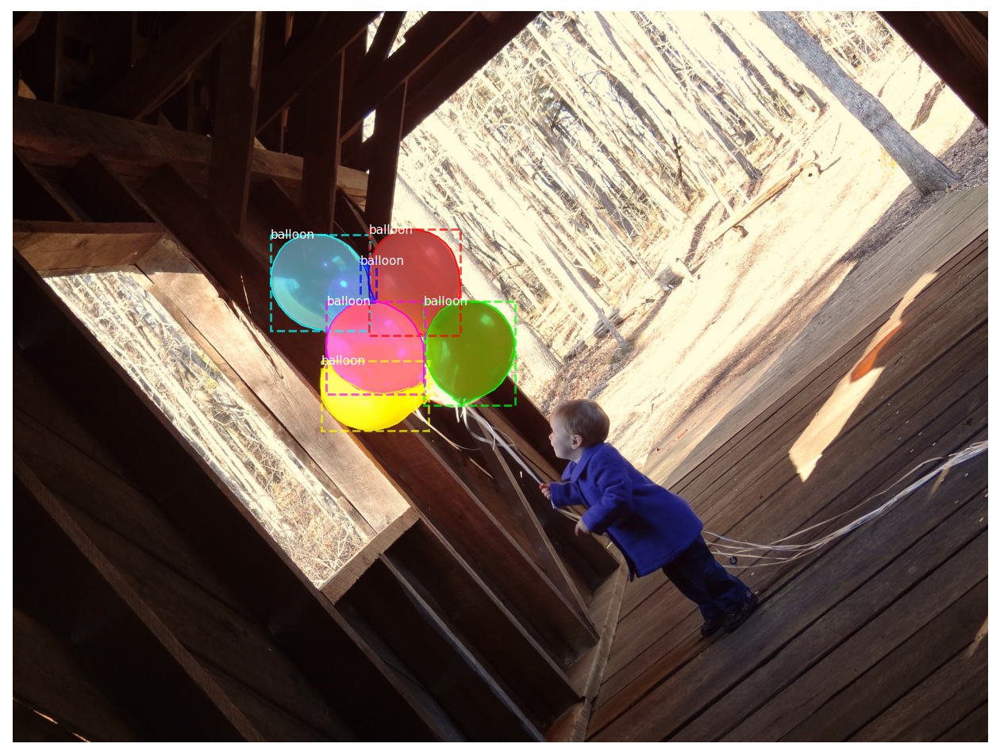

In [95]:
visualize.display_instances(img, bbox, mask, class_ids, dataset_train.class_names, show_bbox=True)

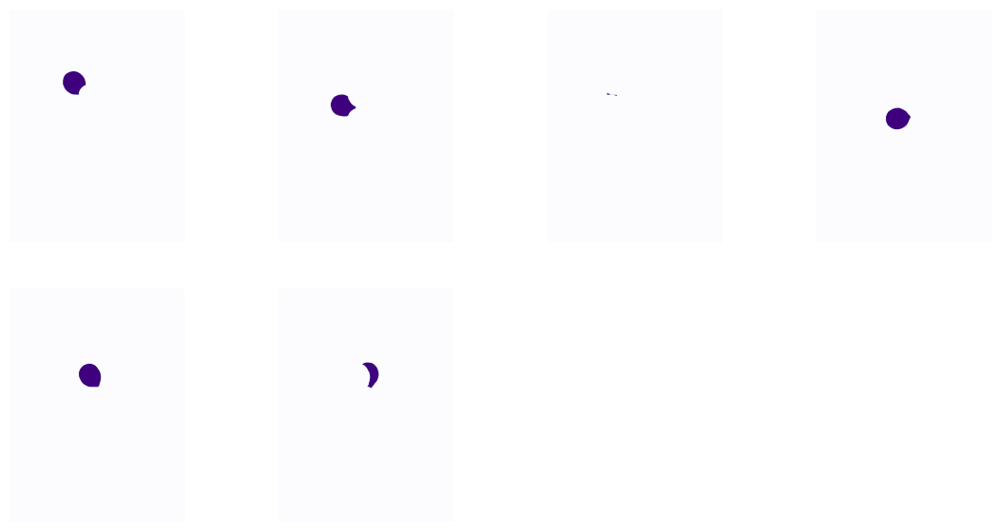

In [96]:
visualize.display_images(np.transpose(mask), cmap='Purples')

In [ ]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

# **Configurações da Rede Neural**

In [98]:
class ConfigRede(Config):
  NAME = 'balloon'
  IMAGES_PER_GPU = 2
  NUM_CLASSES = 1 + 1
  STEPS_PER_EPOCH = 100
  DETECTION_MIN_CONFIDENCE = 0.9
  USE_MINI_MASK=False
  IMAGE_MIN_DIM = 512
  IMAGE_MAX_DIM = 512
  VALIDATION_STEPS = 5
config = ConfigRede()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE             

In [34]:
path_modelos = os.path.join(path_raiz, 'logs')
path_modelos

'/content/Mask_RCNN-TF2/logs'

# Carregamento dos Pesos

In [99]:
# Transferência de aprendizagem
path_modelo_COCO = os.path.join(path_raiz, 'mask_rcnn_coco.h5')
path_modelo_COCO

'/content/Mask_RCNN-TF2/mask_rcnn_coco.h5'

In [100]:
if not os.path.exists(path_modelo_COCO):
  utils.download_trained_weights(path_modelo_COCO)

In [101]:
def carrega_modelo_treinamento(config, inicia_com = 'coco', model_path=''):
#criando a rede neural instanciando objeto da classe MaskRCNN
  model = modellib.MaskRCNN(mode = 'training', config = config, model_dir=model_path)
  if inicia_com == 'coco':
    model.load_weights(path_modelo_COCO, by_name = True, exclude = ['mrcnn_class_logits', 'mrcnn_bbox_fc', 'mrcnn_bbox', 'mrcnn_mask'])
  elif inicia_com == 'imagenet':
    model.load_weights(model.get_imagenet_weights(), by_name=True)
  elif inicia_com == 'last':
    if model_path == "":
      model_path = model.find_last()
    model.load_weights(model_path, by_name=True)

  return model

In [38]:
model = carrega_modelo_treinamento(config, 'coco')










# Treinamento

In [102]:
!nvidia-smi

Fri Jun 30 07:30:07 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   77C    P0    34W /  70W |   5973MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
inicio = time.time()
model.train(dataset_train, dataset_val, learning_rate = config.LEARNING_RATE, epochs = 25, layers = 'heads')
fim_treino = time.time()
minutos = round(fim_treino - inicio / 60, 2)
print("tempo de treinamento", minutos)

# TESTES

**Configuração da rede neural para inferência**




In [103]:
class InferenceConfig(ConfigRede):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
Inference_Config = InferenceConfig()

In [104]:
!cp /content/drive/MyDrive/mask_rcnn_balloon_0023.h5 /content/

In [105]:
def carrega_modelo_teste(model_path='ultimo'):
  inference_config = InferenceConfig()
  model = modellib.MaskRCNN(mode = 'inference', config=inference_config, model_dir=model_path)
  if model_path == 'ultimo':
    model_path = model.find_last()
  print('Carregando os pesos de', model_path)
  model.load_weights(model_path, by_name=True)
  return model, inference_config

In [106]:
model_teste, inference_config = carrega_modelo_teste('/content/mask_rcnn_balloon_0023.h5')

Carregando os pesos de /content/mask_rcnn_balloon_0023.h5


# **Segmentação em Imagens de Testes**

In [107]:
!cp -r /content/drive/MyDrive/fotos-20230420T040945Z-001/fotos /content/fotos/

In [108]:
dataset_val.class_names

['BG', 'balloon']

In [109]:
def segmentar_imagem(model_teste, img):
  resultados = model_teste.detect([img], verbose=0)
  r = resultados[0]
  visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], dataset_val.class_names, r['scores'], figsize=(12,10))
  return r

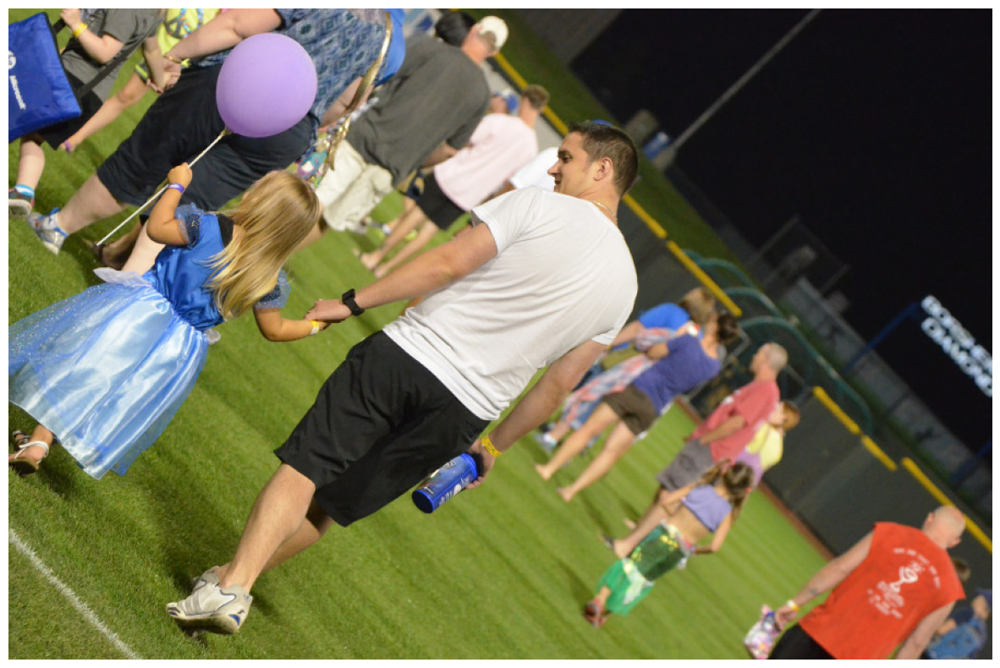

In [110]:
img_teste = imread('/content/fotos/baloes_teste01.jpg')
mostrar(img_teste)

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


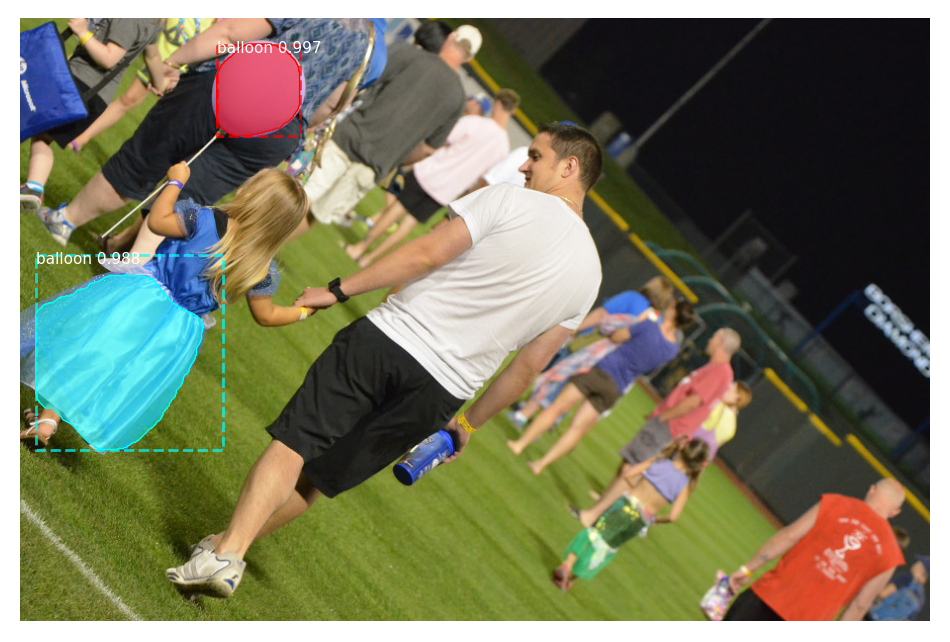

In [111]:
r = segmentar_imagem(model_teste, img_teste)

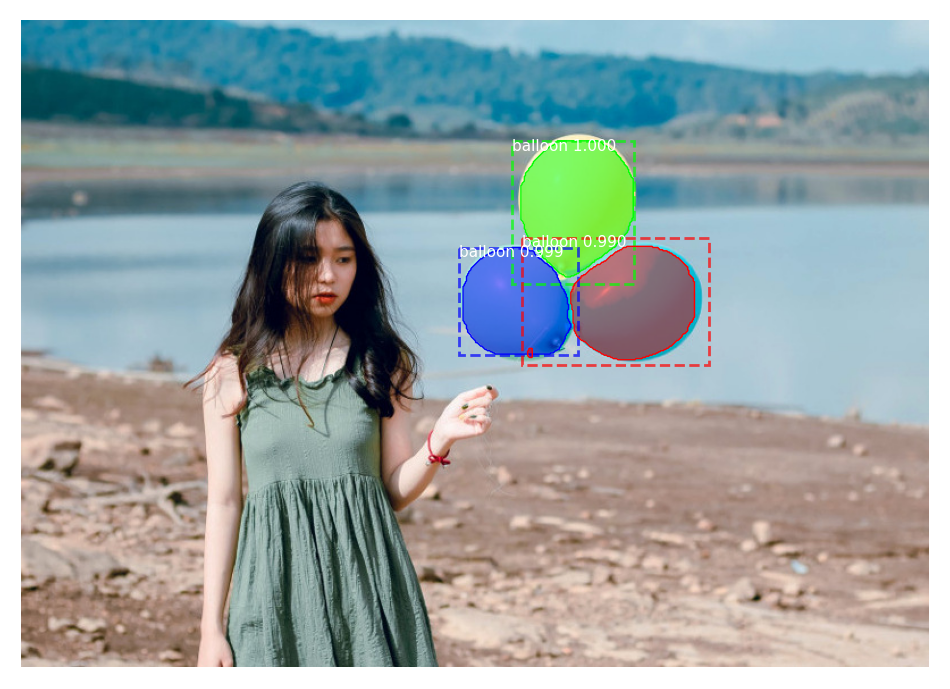

In [112]:
img_teste = imread("/content/fotos/baloes_teste02.jpg")
r = segmentar_imagem(model_teste, img_teste)

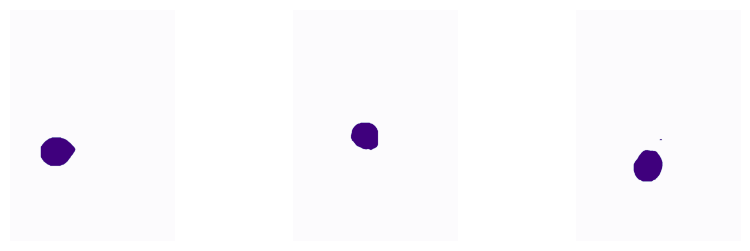

In [60]:
visualize.display_images(np.transpose(r['masks']), cmap="Purples")

# **Segmentação em Imagens de Validação**

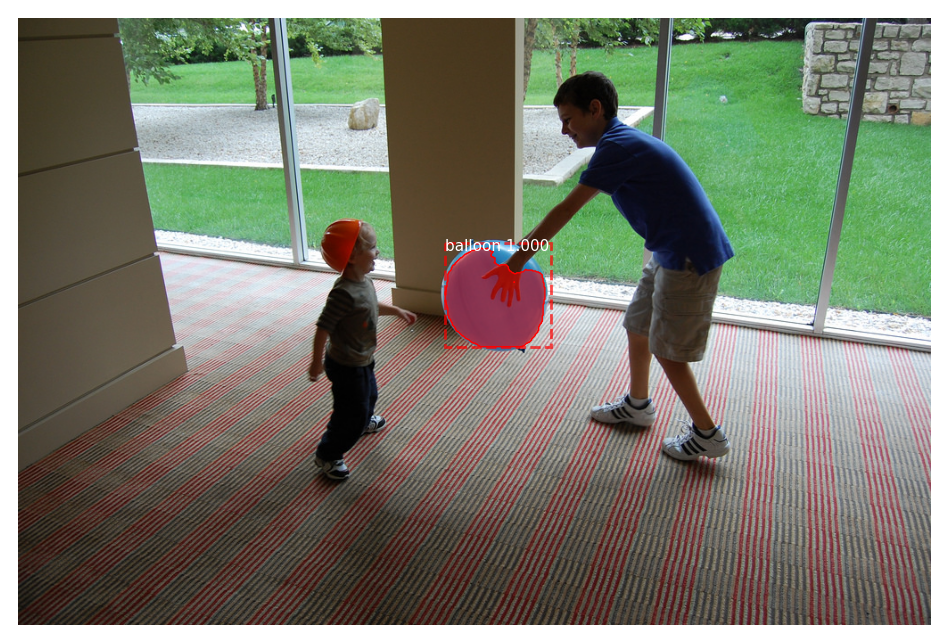

In [62]:
img_id = random.choice(dataset_val.image_ids)
img_original = dataset_val.load_image(img_id)
r = segmentar_imagem(model_teste, img_original)

# **Avaliação do MODELO**

In [113]:
APs = []
for img_id in dataset_val.image_ids:
  #print(img_id)
  img, img_meta, gt_class_id, gt_bbox, gt_mask = modellib.load_image_gt(dataset_val, inference_config, img_id)

  resultados = model_teste.detect([img], verbose=0)
  r = resultados[0]

  AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask, r['rois'], r['class_ids'], r['scores'], r['masks'])
  APs.append(AP)
  print(AP)
print('mAP: ', np.mean(APs))

1.0
0.7142857313156128
0.3333333432674408
0.1666666716337204
0.0
0.7142857313156128
1.0
0.3333333432674408
1.0
0.8333333134651184
1.0
1.0
1.0
mAP:  0.6996337026357651


In [76]:
def compara_validacao(model_teste, img_id, dataset_val, inference_config):

    img_original, img_meta, gt_class_id, gt_bbox, gt_mask = modellib.load_image_gt(dataset_val, inference_config,
                                                                                   img_id)

    print("Resultado do modelo treinado vs. Anotação da máscara original (ground-truth)")

    # Resultado do modelo treinado
    resultados = model_teste.detect([img_original], verbose=0)
    r = resultados[0]
    visualize.display_instances(img_original, r['rois'], r['masks'], r['class_ids'],
                                dataset_val.class_names, r['scores'], figsize = (10,10))

    # Anotação da máscara original (ground-truth)
    visualize.display_instances(img_original, gt_bbox, gt_mask, gt_class_id,
                                dataset_val.class_names, figsize=(10, 10))

Resultado do modelo treinado vs. Anotação da máscara original (ground-truth)


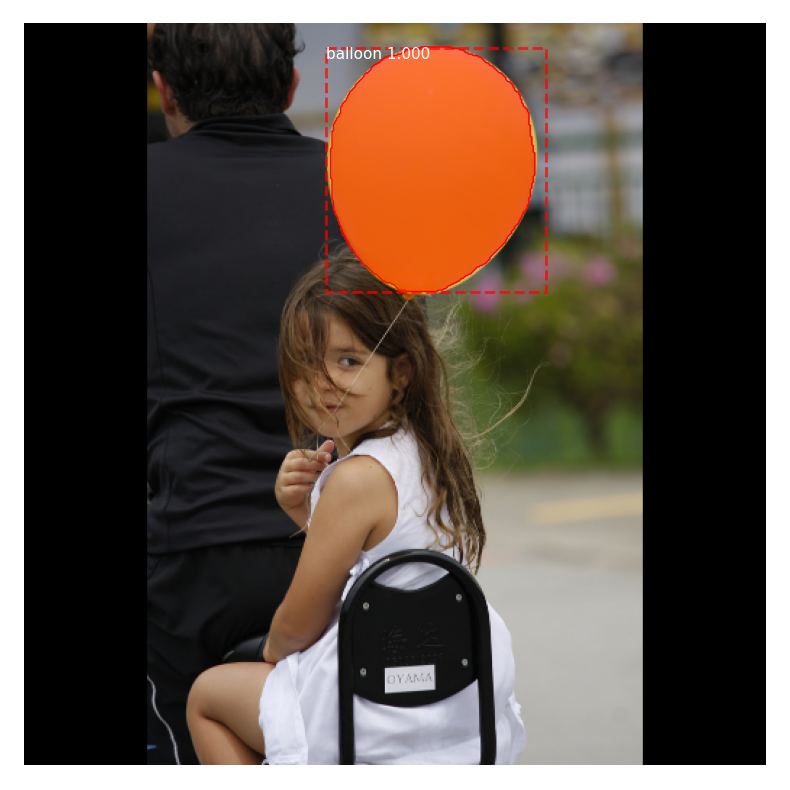

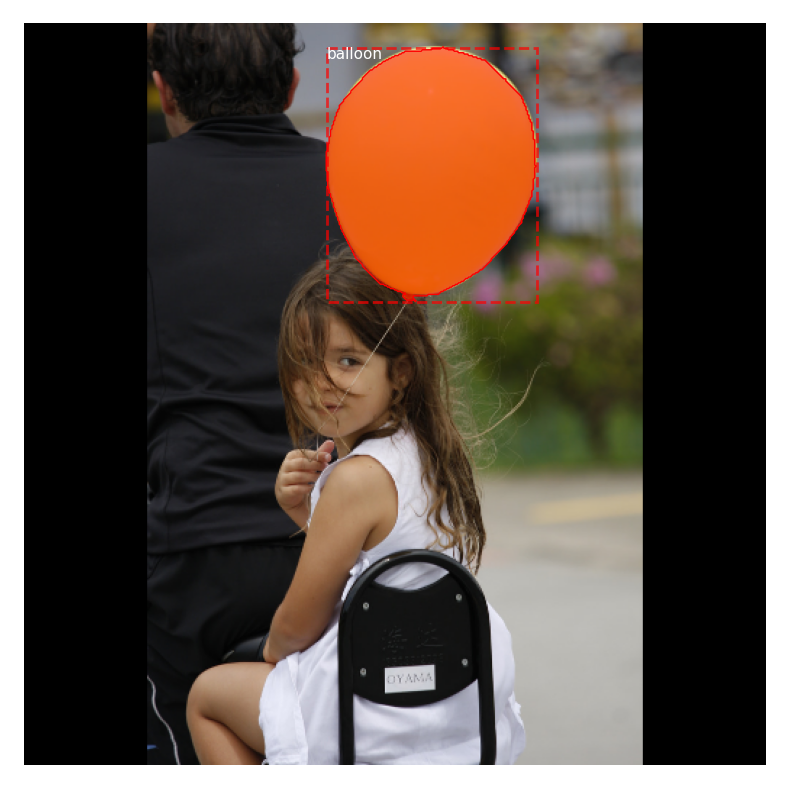

In [114]:
img_id = random.choice(dataset_val.image_ids)
compara_validacao(model_teste, img_id, dataset_val, inference_config)

**Efeito Cut Out**

In [115]:
def efeito_cutout(img, mask):
    gray = skimage.color.gray2rgb(skimage.color.rgb2gray(img)) * 255
    # Copia as cores dos pixels da imagem original, apenas para aqueles que estão dentro da área da máscara
    if mask.shape[-1] > 0:
        mask = (np.sum(mask, -1, keepdims=True) >= 1)
        # Aplica o efeito apenas na área da máscara
        splash = np.where(mask, img, gray).astype(np.uint8)
    else:
        splash = gray.astype(np.uint8)
    return splash

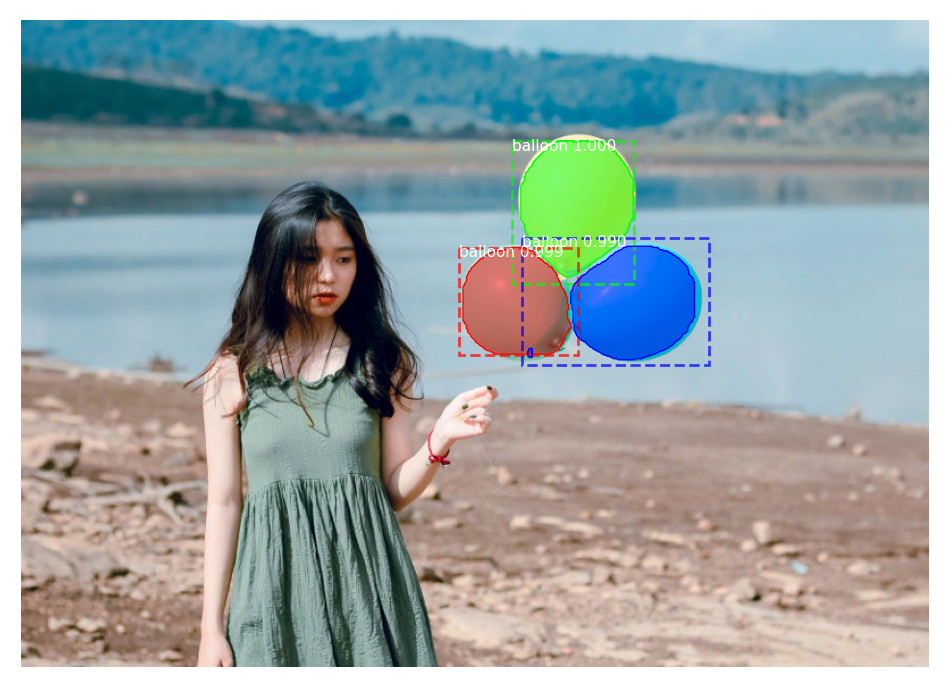

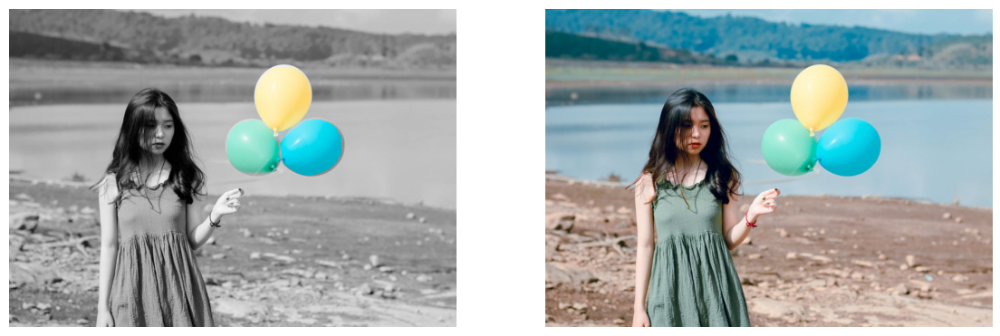

In [117]:
img_original = imread('/content/fotos/baloes_teste02.jpg')
r = segmentar_imagem(model_teste, img_original)
splash = efeito_cutout(img_original, r['masks'])
visualize.display_images([splash, img_original], cols=2)